
**OBJECTIVE: EDA ON 1M PLAYLIST METADATA**

This notebook deals with the metadata associated with each playlist in the Spotify 1 Million Dataset. A csv file was extracted from the original json files. The original csv cotains fields:

            
1.name           
2.description    
3.num_tracks     
4.num_artists    
5.num_albums     
6.num_followers  
7.collaborative

We added categorical feature called 'popularity_bucket' on the basis of the number of followers of playlist, to compare popular and personal playlists.

We add features like sentiment, emotion using NLP on the basis of playlist names, or presence of emojis in the titlles.


**SECTIONS:**

**I.** EDA using the pre-existing features in the playlist dataset, features like name, playlist_url, number of track, duration, number of artists.

**II.** EDA using NLP where features like emotion and sentimental_score are estimated from playlist titles and descriptions, which are then used to compared playlists of different popularities, durations,etc.



In [ ]:
import pandas as pd
df=pd.read_csv("/content/playlists.csv")

In [ ]:
df.head()

,pid,name,description,num_tracks,num_artists,num_albums,num_followers,collaborative,modified_at
0,0,Throwbacks,NaN,52,37,47,1,False,1.493424e+09
1,1,Awesome Playlist,NaN,39,21,23,1,False,1.506557e+09
2,2,korean,NaN,64,31,51,1,False,1.505693e+09
3,3,mat,NaN,126,86,107,1,False,1.501027e+09
4,4,90s,NaN,17,16,16,2,False,1.401667e+09


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 275376 entries, 0 to 275375
Data columns (total 9 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   pid            275376 non-null  int64  
 1   name           275371 non-null  object 
 2   description    5076 non-null    object 
 3   num_tracks     275376 non-null  int64  
 4   num_artists    275376 non-null  int64  
 5   num_albums     275376 non-null  int64  
 6   num_followers  275376 non-null  int64  
 7   collaborative  275376 non-null  bool   
 8   modified_at    275375 non-null  float64
dtypes: bool(1), float64(1), int64(5), object(2)
memory usage: 17.1+ MB


# **SECTION 1: EDA USING PRE-EXISTING FEATURES**

In [ ]:
# for interactive visuals
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (10, 6)

In [ ]:
#Missing Value Analysis
missing = (
    df.isna()
      .sum()
      .to_frame("missing_count")
      .assign(missing_pct=lambda x: x.missing_count / len(df) * 100)
      .sort_values("missing_pct", ascending=False)
)

missing

,missing_count,missing_pct
description,270300,98.156702
name,5,0.001816
modified_at,1,0.000363
pid,0,0.000000
num_tracks,0,0.000000
num_artists,0,0.000000
num_albums,0,0.000000
num_followers,0,0.000000
collaborative,0,0.000000


**UNIVARIATE ANALYSIS**

In [ ]:
#data cleaning

df["collaborative"] = df["collaborative"].astype("category")

# Convert modified_at (Unix timestamp) → datetime
df["modified_at_dt"] = pd.to_datetime(df["modified_at"], unit="s", errors="coerce")


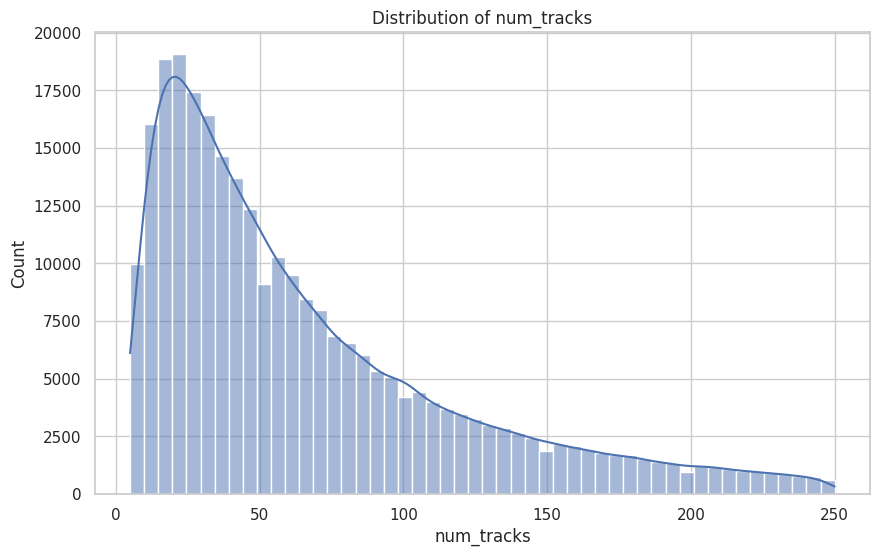

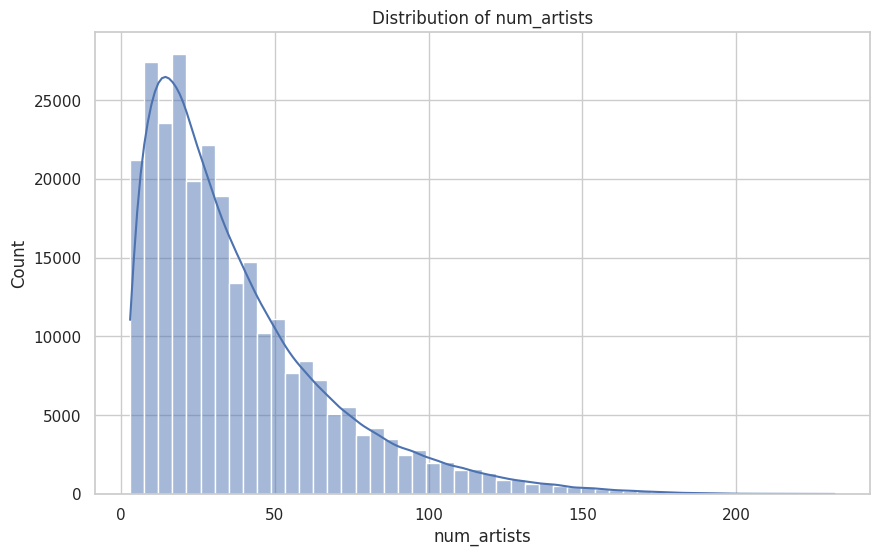

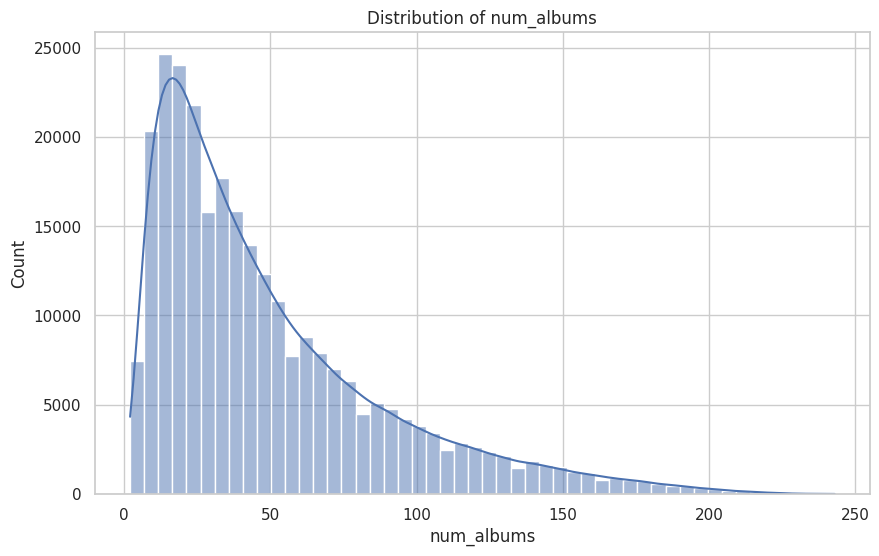

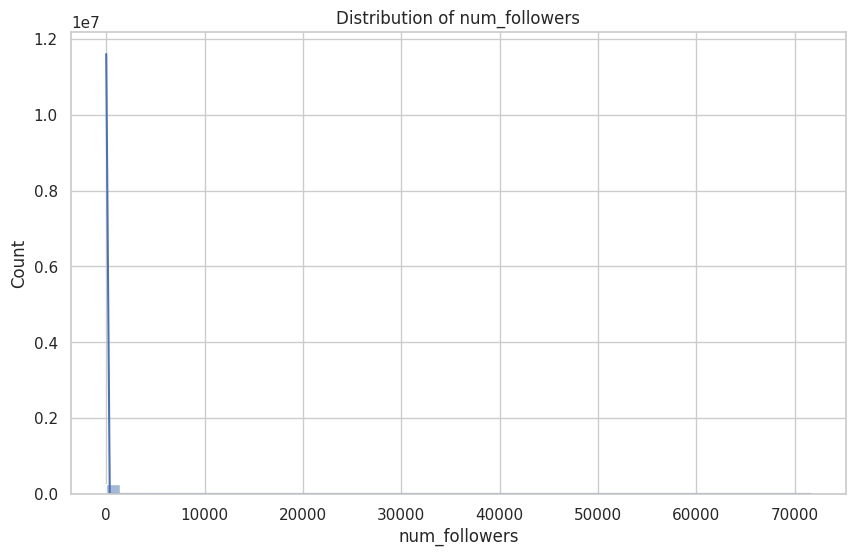

In [ ]:
#Distribution plots

num_cols = [
    "num_tracks",
    "num_artists",
    "num_albums",
    "num_followers"
]

for col in num_cols:
    plt.figure()
    sns.histplot(df[col], bins=50, kde=True)
    plt.title(f"Distribution of {col}")
    plt.show()


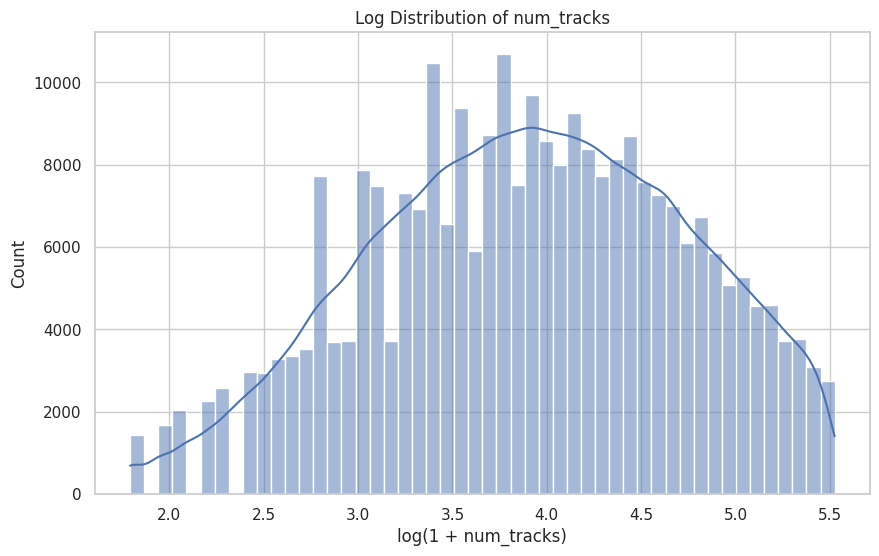

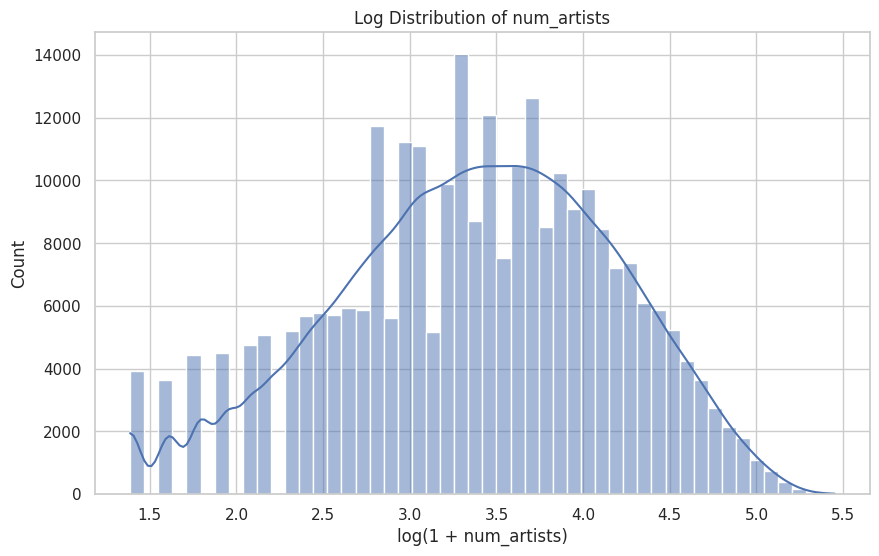

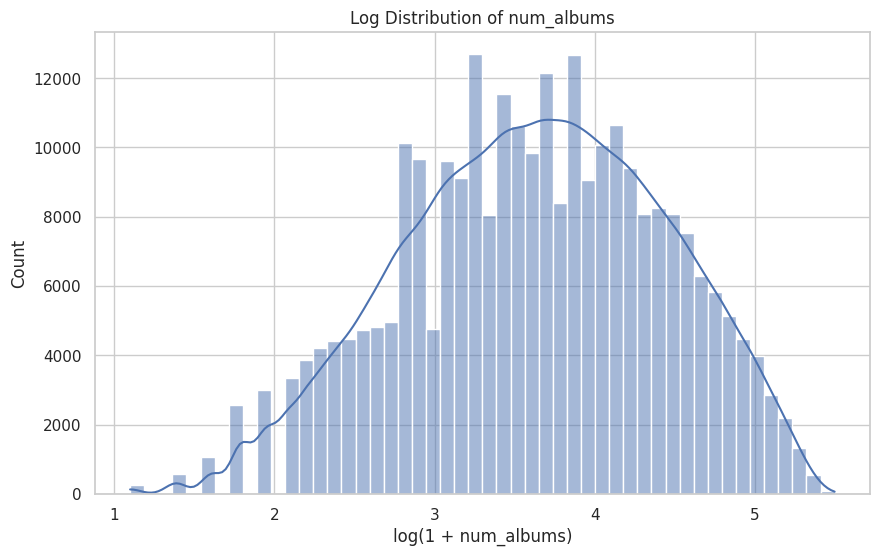

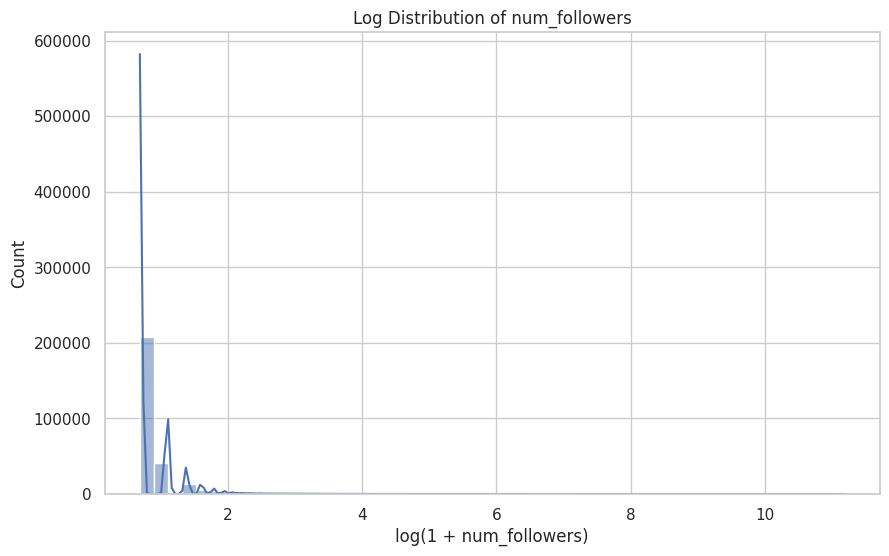

In [ ]:
#Log-scaled

import numpy as np
for col in num_cols:
    plt.figure()
    sns.histplot(np.log1p(df[col]), bins=50, kde=True)
    plt.title(f"Log Distribution of {col}")
    plt.xlabel(f"log(1 + {col})")
    plt.show()

**CATEGORICAL ANALYSIS**

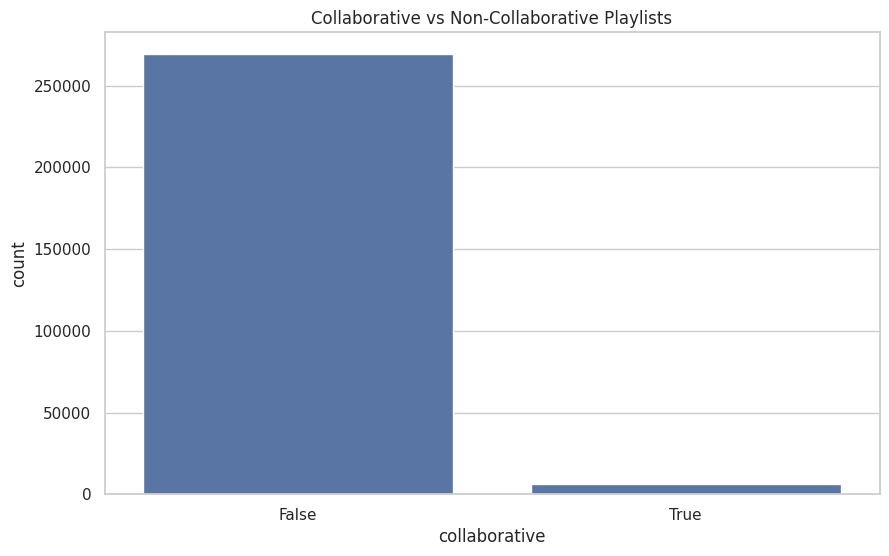

In [ ]:
#Collaborative playlists

df["collaborative"].value_counts(normalize=True) * 100
sns.countplot(data=df, x="collaborative")
plt.title("Collaborative vs Non-Collaborative Playlists")
plt.show()

**RELATIONSHIPS BETWEEN VARIABLES**

Additional features like popularity and title_length have been take into consideration

In [ ]:
#adding metric for popularity (1M playlist csv)

def popularity_bucket(n):
    if n >= 100_000:
        return 'viral / editorial'
    elif n >= 10_000:
        return 'very popular'
    elif n >= 1_000:
        return 'popular'
    elif n >= 100:
        return 'moderate'
    else:
        return 'niche / personal'

df['popularity_bucket'] = (
    df['num_followers']
    .fillna(0)
    .apply(popularity_bucket)
)


**Mean title length for each popularity bucket**

In [ ]:
df['title_length'] = df['name'].astype(str).str.len()
df.groupby('popularity_bucket')['title_length'].var()


,title_length
popularity_bucket,
moderate,18.898204
niche / personal,17.120567
popular,17.975610
very popular,14.700000


In [ ]:
df.groupby('popularity_bucket')['title_length'].agg(median='median',iqr=lambda x: x.quantile(0.75) - x.quantile(0.25),
  p90=lambda x: x.quantile(0.9)
)


,median,iqr,p90
popularity_bucket,,,
moderate,8.0,5.0,15.4
niche / personal,7.0,5.0,13.0
popular,10.0,6.0,16.0
very popular,14.0,6.0,17.6


**Analysing lexical rarity**

In [ ]:
generic_patterns = r'best|top|hits|playlist|music|mix'
df['is_generic'] = df['name'].str.lower().str.contains(generic_patterns)


In [ ]:
generic_rate = (
    df
    .groupby('popularity_bucket')['is_generic']
    .mean()
    .reset_index()
)

generic_rate


,popularity_bucket,is_generic
0,moderate,0.083832
1,niche / personal,0.066442
2,popular,0.02439
3,very popular,0.4


In [ ]:
from collections import Counter

names = df['name'].dropna().astype(str)

all_tokens = Counter(
    " ".join(names.str.lower()).split()
)

def lexical_rarity(title):
    tokens = title.lower().split()
    return sum(1 / all_tokens[t] for t in tokens) / len(tokens)

df['lexical_rarity'] = df['name'].dropna().apply(lexical_rarity)

In [ ]:
# Most idiosyncratic titles
df.sort_values('lexical_rarity', ascending=False)[
    ['name', 'lexical_rarity']
].head(10)


,name,lexical_rarity
71787,Pary,1.0
275281,thrash.,1.0
41,Belters,1.0
71793,Shortlist,1.0
71868,4x4,1.0
71873,#ViNTAGE,1.0
71573,lalala.,1.0
71575,Festive,1.0
72061,oct.,1.0
72082,Funck,1.0


In [ ]:
rarity_summary = (
    df
    .groupby('popularity_bucket')['lexical_rarity']
    .agg(
        median='median',
        iqr=lambda x: x.quantile(0.75) - x.quantile(0.25),
        mean='mean'
    )
)

rarity_summary

,median,iqr,mean
popularity_bucket,,,
moderate,0.006934,0.053526,0.073904
niche / personal,0.003359,0.025577,0.046277
popular,0.018067,0.053259,0.062014
very popular,0.011246,0.024197,0.015254


**Number of tracks vs Number of artists in a playlist**

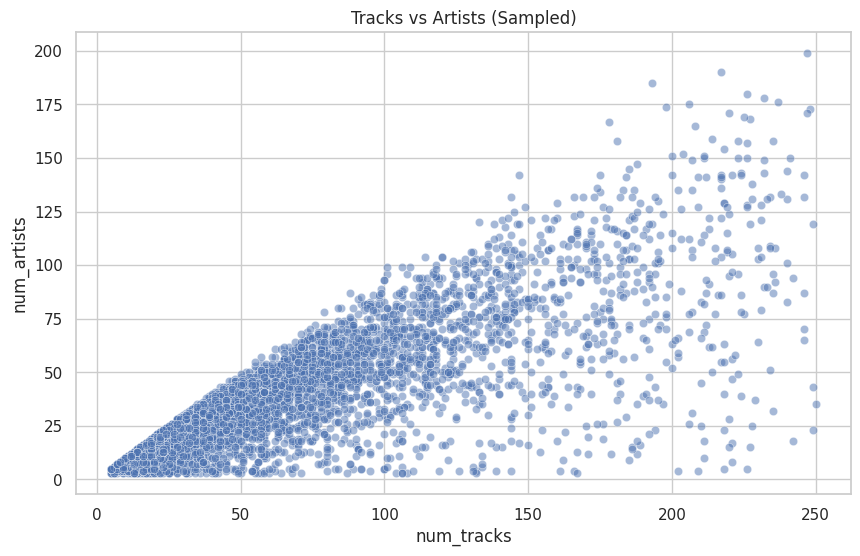

In [ ]:
#Tracks vs Artists
sns.scatterplot(
    data=df.sample(5000, random_state=42),
    x="num_tracks",
    y="num_artists",
    alpha=0.5
)
plt.title("Tracks vs Artists (Sampled)")
plt.show()


**Number of tracks vs Number of followers for each playlist**

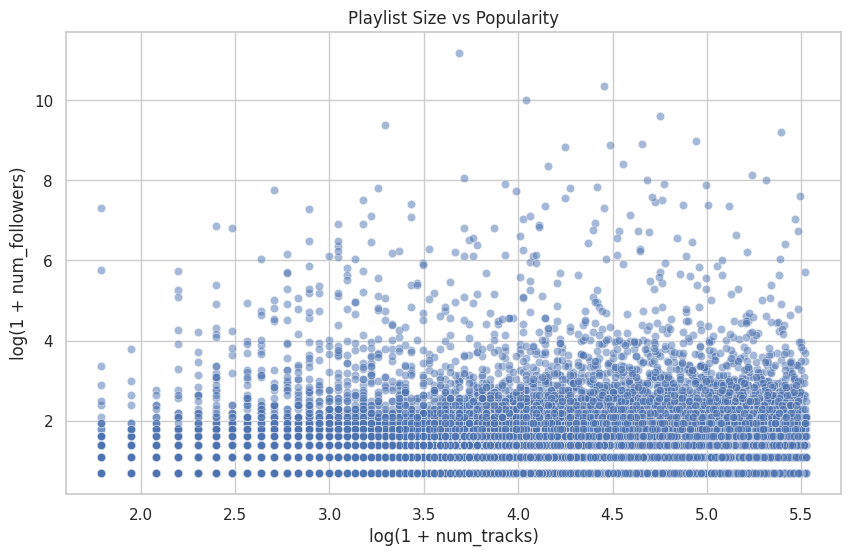

In [ ]:
#Tracks vs followers (log scale)

sns.scatterplot(
    data=df.sample(5000, random_state=42),
    x=np.log1p(df["num_tracks"]),
    y=np.log1p(df["num_followers"]),
    alpha=0.5
)
plt.xlabel("log(1 + num_tracks)")
plt.ylabel("log(1 + num_followers)")
plt.title("Playlist Size vs Popularity")
plt.show()


**GROUPED COMPARISONS**

**Number of tracks in collaborative vs non-collaborative playlists**

/tmp/ipython-input-2159151114.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby("collaborative")[num_cols].median()


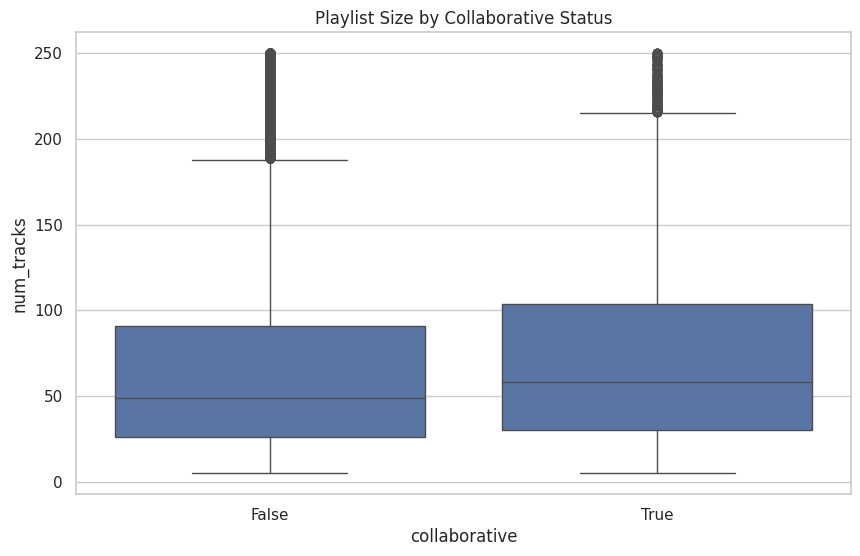

In [ ]:
#Collaborative vs non-collaborative stats

df.groupby("collaborative")[num_cols].median()
sns.boxplot(
    data=df,
    x="collaborative",
    y="num_tracks"
)
plt.title("Playlist Size by Collaborative Status")
plt.show()


**Distribution of number of tracks per playlist by popularity bucket**

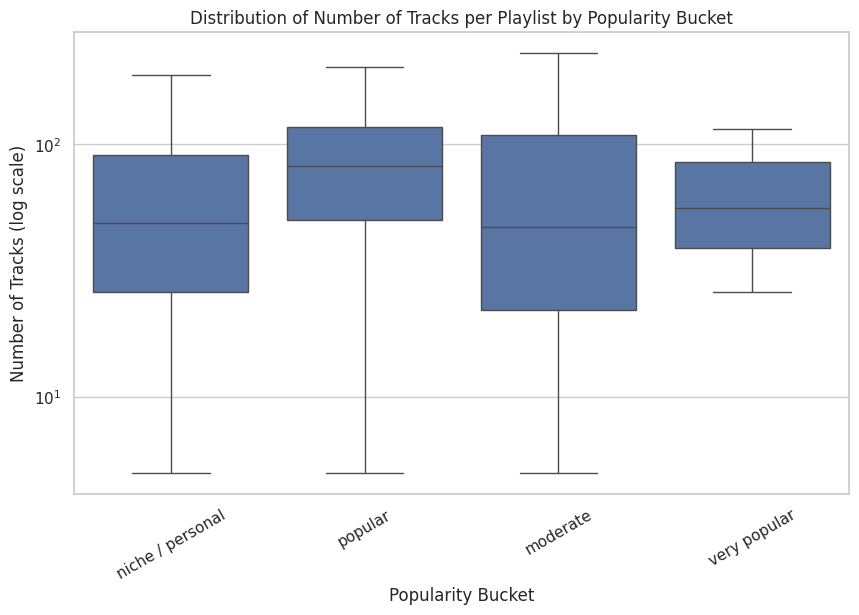

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

plt.figure(figsize=(10, 6))

sns.boxplot(
    data=df,
    x="popularity_bucket",
    y="num_tracks",
    showfliers=False
)

plt.yscale("log")
plt.title("Distribution of Number of Tracks per Playlist by Popularity Bucket")
plt.xlabel("Popularity Bucket")
plt.ylabel("Number of Tracks (log scale)")
plt.xticks(rotation=30)
plt.show()


In [ ]:
curation_palette = {
    "niche / personal": "#aa81a0",   # deep teal → intimate, user-curated
    "moderate": "#7d7a9e",           # growing but still organic
    "popular": "#d69e9e",            # discovery sweet spot
    "very popular": "#4e8b73",       # neutral / algorithmic balance
    "viral / editorial": "#aba88c"   # platform-driven, high exposure
}
bucket_order = [
    "niche / personal",
    "moderate",
    "popular",
    "very popular",
]


/tmp/ipython-input-3630018469.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-3630018469.py:3: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



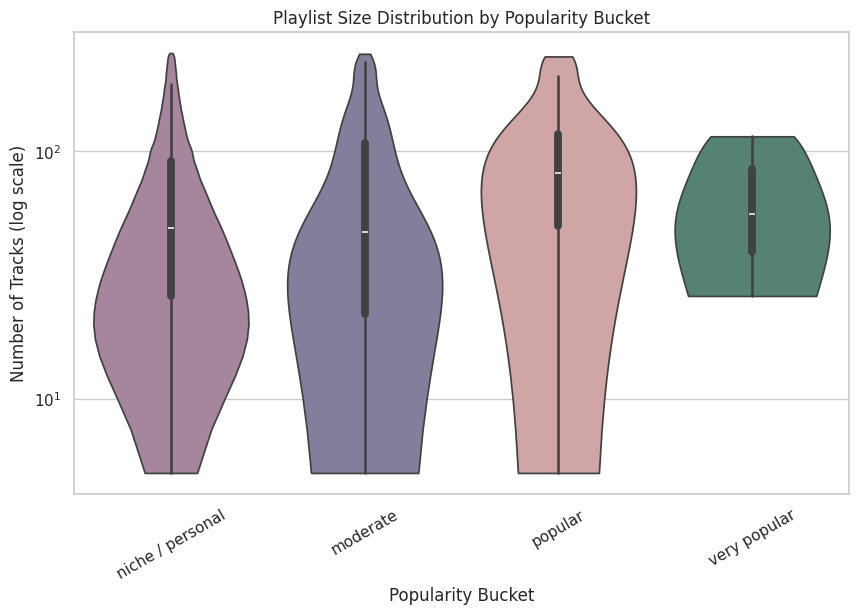

In [ ]:
plt.figure(figsize=(10, 6))

sns.violinplot(
    data=df,
    x="popularity_bucket",
    y="num_tracks",
    palette=curation_palette,
    order=bucket_order,
    scale="width",
    cut=0
)

plt.yscale("log")
plt.title("Playlist Size Distribution by Popularity Bucket")
plt.xlabel("Popularity Bucket")
plt.ylabel("Number of Tracks (log scale)")
plt.xticks(rotation=30)
plt.show()


/tmp/ipython-input-93909130.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-93909130.py:6: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



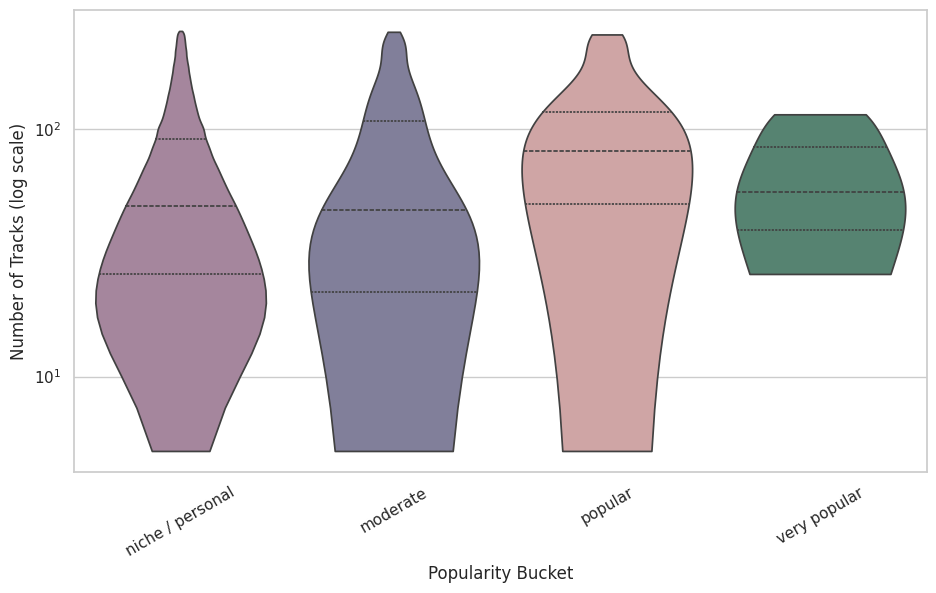

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(11, 6))

sns.violinplot(
    data=df,
    x="popularity_bucket",
    y="num_tracks",
    palette=curation_palette,
    order=bucket_order,
    scale="width",
    cut=0,
    inner="quartile"
)

plt.yscale("log")
plt.xlabel("Popularity Bucket")
plt.ylabel("Number of Tracks (log scale)")
plt.xticks(rotation=30)
plt.show()


In [ ]:
import plotly.express as px

fig = px.box(
    df,
    x="popularity_bucket",
    y="num_tracks",
    log_y=True,
    title="Distribution of Number of Tracks per Playlist by Popularity Bucket",
    labels={
        "num_tracks": "Number of Tracks (log scale)",
        "popularity_bucket": "Popularity Bucket"
    }
)

fig.show()


**Number of tracks vs number of unique artists**

/tmp/ipython-input-3681632014.py:6: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



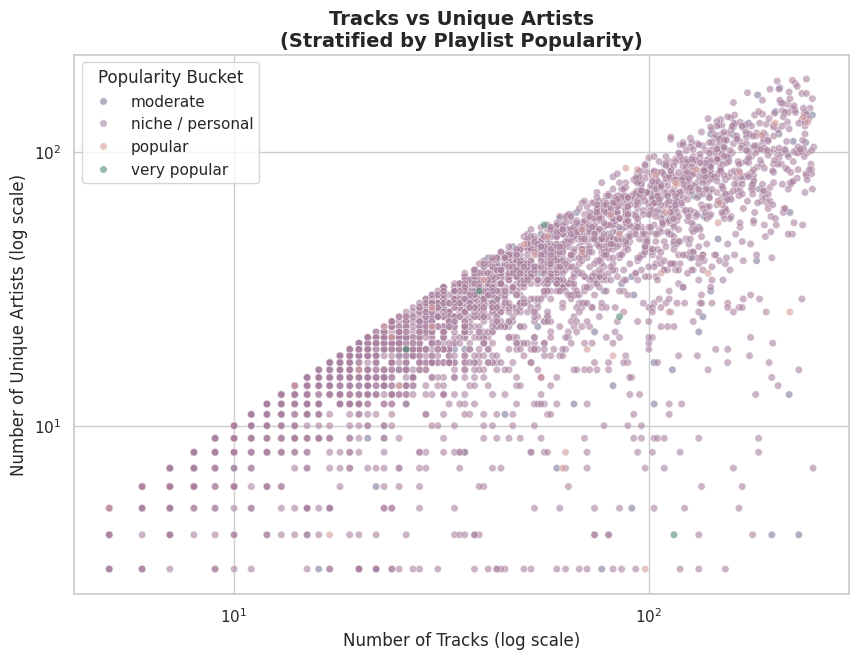

In [ ]:
 # same number of points per bucket
N = 3000

sample_balanced = (
    df.groupby("popularity_bucket", group_keys=False)
      .apply(lambda x: x.sample(min(len(x), N), random_state=42))
)

plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=sample_balanced,
    x="num_tracks",
    y="num_artists",
    hue="popularity_bucket",
    palette=curation_palette,
    alpha=0.6,
    s=28
)

plt.xscale("log")
plt.yscale("log")

plt.title(
    "Tracks vs Unique Artists\n(Stratified by Playlist Popularity)",
    fontsize=14,
    weight="bold"
)
plt.xlabel("Number of Tracks (log scale)")
plt.ylabel("Number of Unique Artists (log scale)")
plt.legend(title="Popularity Bucket")
plt.show()


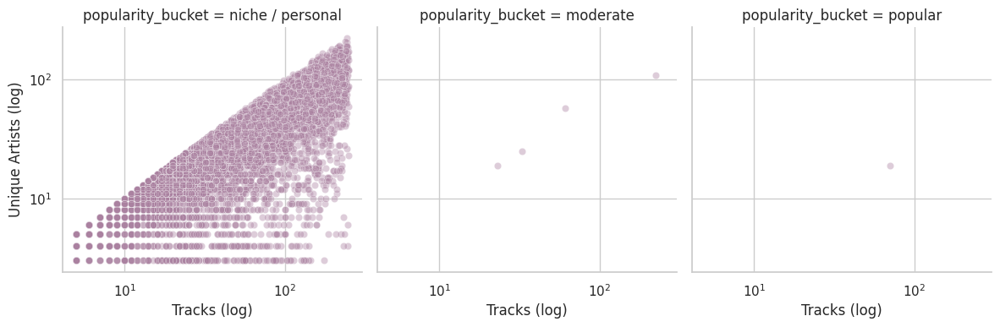

In [ ]:
sample = df.sample(12000, random_state=42)

g = sns.FacetGrid(
    sample,
    col="popularity_bucket",
    col_wrap=3,
    height=4,
    sharex=True,
    sharey=True
)

g.map_dataframe(
    sns.scatterplot,
    x="num_tracks",
    y="num_artists",
    alpha=0.4,
    color="#aa81a0"
)

for ax in g.axes.flatten():
    ax.set_xscale("log")
    ax.set_yscale("log")

g.set_axis_labels("Tracks (log)", "Unique Artists (log)")


plt.show()


/tmp/ipython-input-1631581858.py:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-1631581858.py:11: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



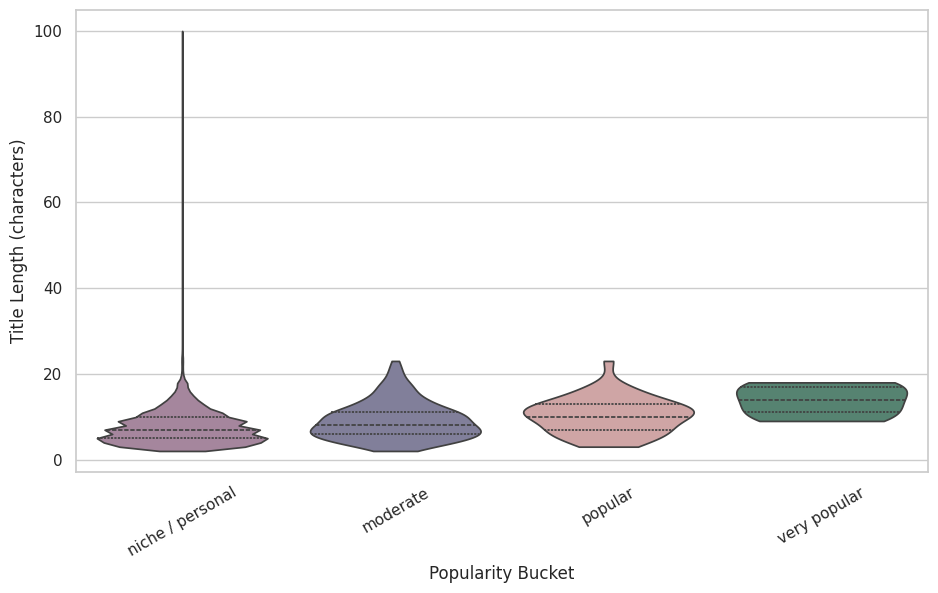

In [ ]:
# title length in characters


df["title_length"] = df["name"].astype(str).str.len()
df_no_editorial = df[df["popularity_bucket"] != "viral / editorial"]
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(11, 6))

sns.violinplot(
    data=df_no_editorial,
    x="popularity_bucket",
    y="title_length",
    order=bucket_order,
    palette=curation_palette,
    scale="width",
    cut=0,
    inner="quartile"
)

plt.xlabel("Popularity Bucket")
plt.ylabel("Title Length (characters)")
plt.xticks(rotation=30)
plt.show()


**TIME ANALYSIS**

In [ ]:
#Playlists over time
df["year"] = df["modified_at_dt"].dt.year

yearly = df["year"].value_counts().sort_index()

yearly

,count
year,
2011.0,96
2012.0,765
2013.0,9952
2014.0,17592
2015.0,30580
2016.0,59302
2017.0,157088


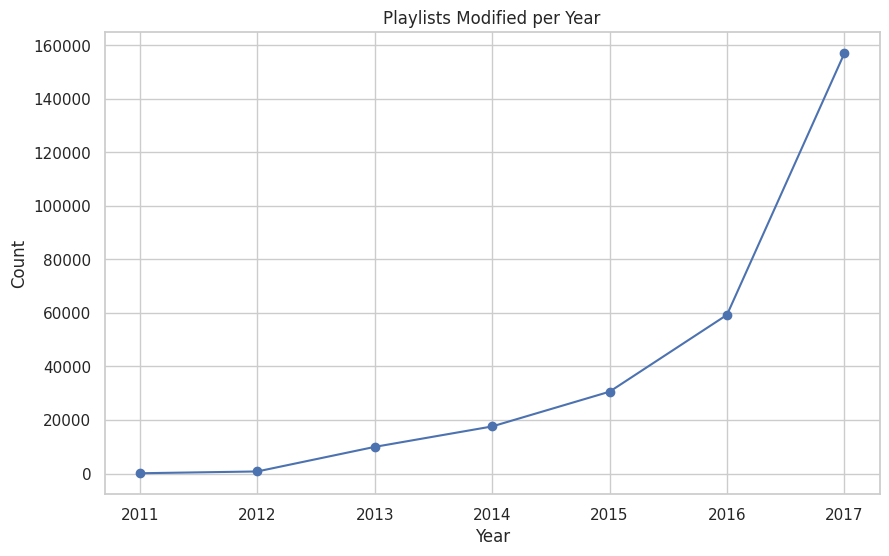

In [ ]:
yearly.plot(kind="line", marker="o")
plt.title("Playlists Modified per Year")
plt.xlabel("Year")
plt.ylabel("Count")
plt.show()


**CORRELATION ANALYSIS**

In [ ]:
corr = df[num_cols].corr()
corr


,num_tracks,num_artists,num_albums,num_followers
num_tracks,1.000000,0.820194,0.901823,0.002849
num_artists,0.820194,1.000000,0.956155,0.001650
num_albums,0.901823,0.956155,1.000000,0.001168
num_followers,0.002849,0.001650,0.001168,1.000000


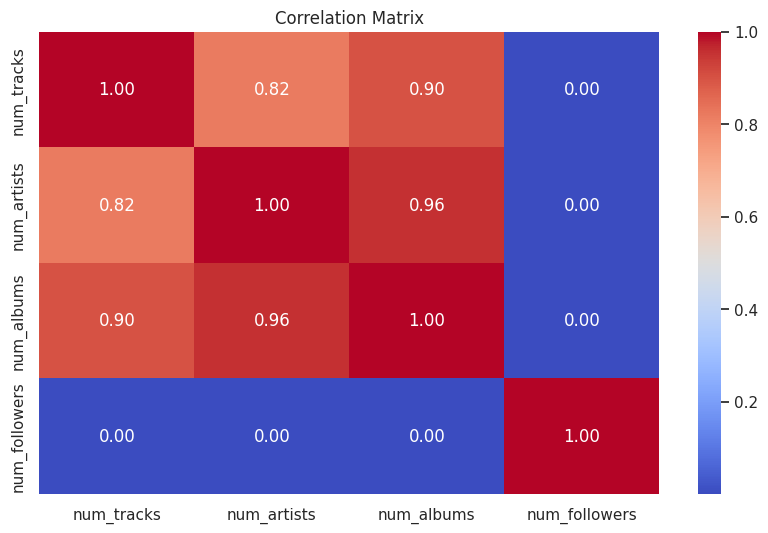

In [ ]:
sns.heatmap(
    corr,
    annot=True,
    cmap="coolwarm",
    fmt=".2f"
)
plt.title("Correlation Matrix")
plt.show()


**OUTLIER INSPECTION**

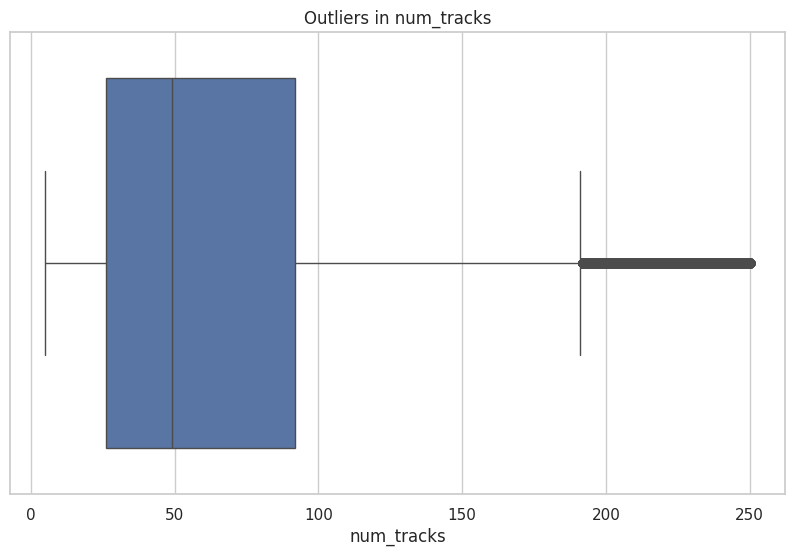

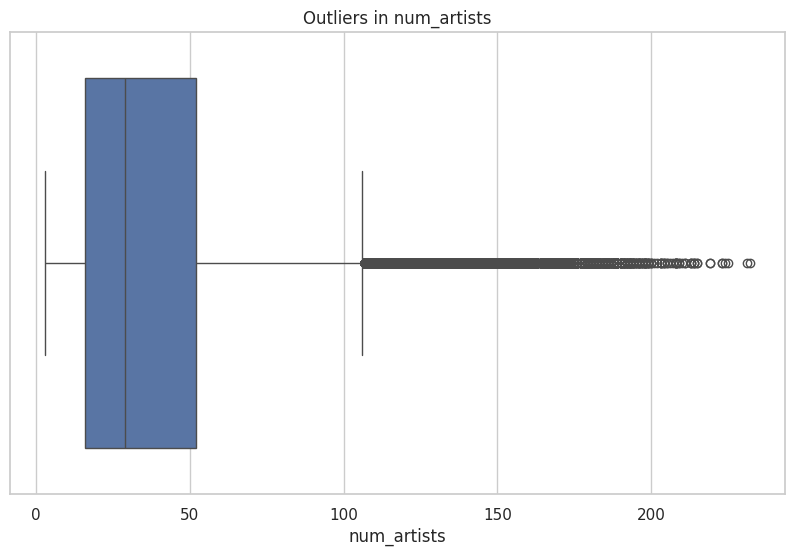

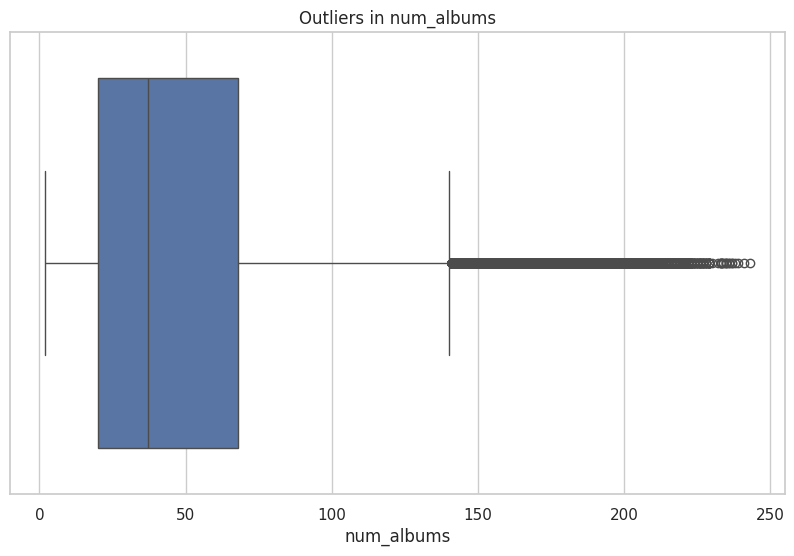

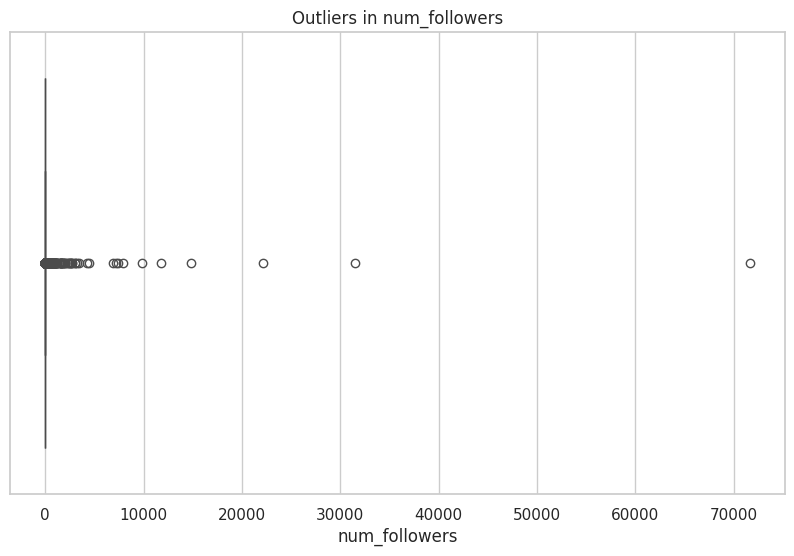

In [ ]:
for col in num_cols:
    sns.boxplot(x=df[col])
    plt.title(f"Outliers in {col}")
    plt.show()


**INTERACTIVE PLOT**

In [ ]:
sample = df.sample(5000, random_state=42)

fig = px.scatter(
    sample,
    x="num_tracks",
    y="num_followers",
    color="collaborative",
    log_x=True,
    log_y=True,
    title="Playlist Size vs Followers (Interactive)"
)

fig.show()


# **SECTION 2: EDA USING NLP**

In [ ]:
# Keep only valid playlist names
df = df[df['name'].notna()]
df['name'] = df['name'].astype(str)

/tmp/ipython-input-2866337477.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



**BASIC TEXT PREPROCESSING**

In [ ]:
import nltk
import re

from nltk.corpus import stopwords

nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

def clean_text(text):
    text = text.lower()
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"[^a-zA-Z\s]", "", text)
    tokens = text.split()
    tokens = [t for t in tokens if t not in stop_words]
    return " ".join(tokens)

df['clean_name'] = df['name'].apply(clean_text)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
/tmp/ipython-input-1435997549.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



**MOST COMMON WORDS**

In [ ]:
from collections import Counter

all_words = " ".join(df['clean_name']).split()
word_freq = Counter(all_words)

print(word_freq.most_common(100))


[('music', 7273), ('country', 6631), ('chill', 6526), ('summer', 6164), ('songs', 5630), ('rock', 4948), ('playlist', 4678), ('good', 4520), ('party', 4400), ('new', 4344), ('jams', 4335), ('rap', 4233), ('workout', 3762), ('christmas', 3604), ('oldies', 3200), ('old', 3001), ('mix', 2628), ('vibes', 2463), ('love', 2109), ('dance', 2082), ('throwback', 2018), ('car', 2017), ('school', 1945), ('feels', 1930), ('work', 1899), ('lit', 1889), ('worship', 1849), ('wedding', 1826), ('classic', 1658), ('fall', 1604), ('pop', 1542), ('disney', 1524), ('road', 1508), ('stuff', 1497), ('best', 1451), ('time', 1355), ('hop', 1333), ('spring', 1310), ('happy', 1310), ('hip', 1268), ('run', 1214), ('running', 1212), ('slow', 1173), ('gym', 1171), ('trip', 1162), ('classics', 1161), ('throwbacks', 1158), ('christian', 1117), ('edm', 1113), ('sleep', 1107), ('tunes', 1107), ('feel', 1043), ('random', 1042), ('sad', 1035), ('study', 1002), ('shower', 972), ('jamz', 962), ('spanish', 960), ('hype', 94

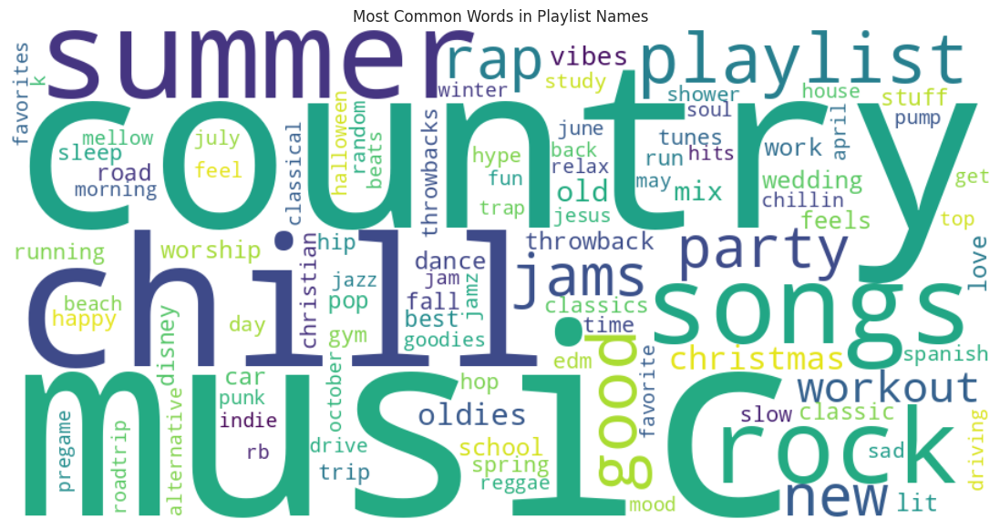

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter

all_words = " ".join(df['clean_name']).split()
word_freq = Counter(all_words)

wc = WordCloud(
    width=900,
    height=450,
    background_color="white",
    max_words=100
).generate_from_frequencies(word_freq)

plt.figure(figsize=(14, 7))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("Most Common Words in Playlist Names")
plt.show()


**TF-IDF + CLUSTERING (THEME DISCOVERY)**

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import MiniBatchKMeans

custom_stopwords = [
    "music", "playlist", "songs", "song", "mix", "jams", "jamz", "tunes", "list"
]

vectorizer = TfidfVectorizer(
    max_features=1500,        # reduced
    ngram_range=(1, 2),
    min_df=10,                # more aggressive pruning
    max_df=0.5,
    stop_words=custom_stopwords
)

X = vectorizer.fit_transform(df["clean_name"].fillna(""))


In [ ]:
kmeans = MiniBatchKMeans(
    n_clusters=8,
    random_state=42,
    batch_size=2048,
    n_init=5
)

df["theme_cluster"] = kmeans.fit_predict(X)


/tmp/ipython-input-1588883614.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
import numpy as np

def print_top_terms(kmeans, vectorizer, n_terms=10):
    terms = vectorizer.get_feature_names_out()

    for i, center in enumerate(kmeans.cluster_centers_):
        top_idx = np.argsort(center)[-n_terms:][::-1]
        top_terms = [terms[j] for j in top_idx]

        print(f"\n🎧 Cluster {i}")
        print(" └─ " + ", ".join(top_terms))

print_top_terms(kmeans, vectorizer, n_terms=12)



🎧 Cluster 0
 └─ pump, football, jam, gym, funny, galaxy, game, game day, game time, gameday, games, gaming

🎧 Cluster 1
 └─ summer, rock, workout, party, new, good, work, love, throwback, vibes, lit, worship

🎧 Cluster 2
 └─ rap, christmas, edm, alternative, winter, relax, classical, drive, chillin, jazz, indie, july

🎧 Cluster 3
 └─ oldies, good, fav, favorite, classic, country, best, rock, game, game day, game time, get pumped

🎧 Cluster 4
 └─ feels, fall, summer, good, right, sad, chill, new, like, galaxy, game, get pumped

🎧 Cluster 5
 └─ chill, time, country, indie, house, party, mood, stuff, acoustic, relax, worship, classic

🎧 Cluster 6
 └─ country, girl, party, pop, time, stuff, throwback, classics, upbeat, alt, sad, beach

🎧 Cluster 7
 └─ road, happy, shower, pop, sad, trip, best, rb, study, driving, hype, beach


**Cluster size distribution**

In [ ]:
import plotly.express as px

cluster_counts = df["theme_cluster"].value_counts().sort_index()

fig = px.bar(
    x=cluster_counts.index,
    y=cluster_counts.values,
    labels={"x": "Theme Cluster", "y": "Number of Playlists"},
    title="Playlist Distribution Across Theme Clusters"
)

fig.show()


**TF-IDF → 2D semantic map**

In [ ]:
from sklearn.decomposition import TruncatedSVD

sample_df = df.sample(5000, random_state=42)
X_sample = vectorizer.transform(sample_df["clean_name"])

svd = TruncatedSVD(n_components=2, random_state=42)
X_2d = svd.fit_transform(X_sample)

sample_df["x"] = X_2d[:, 0]
sample_df["y"] = X_2d[:, 1]


In [ ]:
fig = px.scatter(
    sample_df,
    x="x",
    y="y",
    color="theme_cluster",
    title="Semantic Clustering of Playlist Names (TF-IDF + KMeans)",
    opacity=0.6
)

fig.show()


**Cluster keyword heatmap**

In [ ]:
import pandas as pd

terms = vectorizer.get_feature_names_out()
top_terms_per_cluster = []

for i, center in enumerate(kmeans.cluster_centers_):
    top_idx = np.argsort(center)[-10:]
    for idx in top_idx:
        top_terms_per_cluster.append({
            "cluster": i,
            "term": terms[idx],
            "weight": center[idx]
        })

term_df = pd.DataFrame(top_terms_per_cluster)


In [ ]:
fig = px.bar(
    term_df,
    x="term",
    y="weight",
    color="cluster",
    facet_col="cluster",
    title="Top TF-IDF Terms per Theme Cluster",
    height=400
)

fig.show()


**SENTIMENT ANALYSIS (VADER)**

In [ ]:
import sys
!{sys.executable} -m pip install vaderSentiment

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 3.7 MB/s eta 0:00:00


In [ ]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

analyzer = SentimentIntensityAnalyzer()

def get_sentiment(text):
    score = analyzer.polarity_scores(text)
    return score['compound']

df['sentiment_score'] = df['clean_name'].apply(get_sentiment)


/tmp/ipython-input-1201525388.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
#Categorize sentiment

def sentiment_label(score):
    if score >= 0.3:
        return "positive"
    elif score <= -0.3:
        return "negative"
    else:
        return "neutral"

df['sentiment'] = df['sentiment_score'].apply(sentiment_label)


/tmp/ipython-input-274032843.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Visualize sentiment score distribution across popularity buckets

import plotly.express as px
fig_score = px.box(
    df,
    x="popularity_bucket",
    y="sentiment_score",
    color="popularity_bucket",
    title="Sentiment Score Distribution by Playlist Popularity"
)
fig_score.show()

# Visualize sentiment categories distribution across popularity buckets
sentiment_counts = df.groupby(['popularity_bucket', 'sentiment']).size().reset_index(name='count')
fig_sentiment = px.bar(
    sentiment_counts,
    x="popularity_bucket",
    y="count",

    color="sentiment",
    barmode="group",
    title="Sentiment Categories by Playlist Popularity"
)
fig_sentiment.show()

In [ ]:
sentiment_palette = {
    "negative": "#f4a6a6",   # soft coral / muted red
    "neutral":  "#e6e6e6",   # warm light neutral (not cold gray)
    "positive": "#a8ddb5"    # pastel mint green
}



In [ ]:
import plotly.express as px

# count
sentiment_counts = (
    df.groupby(['popularity_bucket', 'sentiment'])
      .size()
      .reset_index(name='count')
)

# normalize within each popularity bucket
sentiment_counts['ratio'] = (
    sentiment_counts
    .groupby('popularity_bucket')['count']
    .transform(lambda x: x / x.sum())
)

fig_sentiment = px.bar(
    sentiment_counts,
    x="popularity_bucket",
    y="ratio",
    color="sentiment",
    barmode="stack",
    color_discrete_map=sentiment_palette,
    category_orders={
        "popularity_bucket": bucket_order
    },
    title="Sentiment Distribution of Playlist Titles by Popularity",
    labels={"ratio": "Proportion", "popularity_bucket": "Popularity Bucket"}
)

fig_sentiment.update_yaxes(
    tickformat=".0%",
    range=[0, 1]
)

fig_sentiment.update_layout(
    legend_title_text="Sentiment",
    template="simple_white",
    bargap=0.25
)

fig_sentiment.show()


**EMOTION DETECTION (NRC LEXICON STYLE)**

In [ ]:
emotion_keywords = {
    "sad": [
        "sad", "cry", "crying", "tears", "heartbreak", "broken",
        "alone", "lonely", "depressed", "pain", "hurt",
        "blue", "down", "empty", "miss", "lost"
    ],

    "happy": [
        "happy", "fun", "joy", "joyful", "smile", "smiling",
        "good", "goodvibes", "vibes", "sunny", "bright",
        "feelgood", "uplifting", "positive", "cheer", "laugh"
    ],

    "calm": [
        "chill", "chilled", "relax", "relaxing", "sleep", "sleepy",
        "calm", "soft", "quiet", "peace", "peaceful",
        "ambient", "lofi", "study", "focus", "slow", "mellow"
    ],

    "energetic": [
        "workout", "gym", "party", "hype", "dance", "dancing",
        "run", "running", "power", "energy", "energetic",
        "pump", "boost", "fast", "upbeat", "club", "rage"
    ],

    "romantic": [
        "love", "romance", "romantic", "kiss", "kissing",
        "date", "crush", "heart", "valentine", "together",
        "couple", "wedding", "intimate", "slowdance"
    ]
}

def detect_emotion(text):
    text = text.lower()
    for emotion, words in emotion_keywords.items():
        if any(w in text for w in words):
            return emotion
    return "unknown"

df['emotion'] = df['clean_name'].apply(detect_emotion)


/tmp/ipython-input-1260808369.py:40: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df['emotion'].value_counts()

,count
emotion,
unknown,225609
energetic,17503
calm,14951
happy,10281
romantic,4540
sad,2487


In [ ]:
import plotly.express as px

vc = df['emotion'].value_counts().reset_index()
vc.columns = ['emotion', 'count']

px.bar(vc, x='emotion', y='count', title='Emotion Distribution').show()


In [ ]:
emotion_popularity = (
    df.groupby(['popularity_bucket', 'emotion'])
      .size()
      .reset_index(name='count')
)

# normalize within each popularity bucket
emotion_popularity['ratio'] = (
    emotion_popularity
    .groupby('popularity_bucket')['count']
    .transform(lambda x: x / x.sum())
)

fig_emotion_pop = px.bar(
    emotion_popularity,
    x="popularity_bucket",
    y="ratio",
    color="emotion",
    barmode="stack",
    title="Emotion Composition by Playlist Popularity",
    labels={"ratio": "Proportion"}
)

fig_emotion_pop.update_yaxes(tickformat=".0%")
fig_emotion_pop.show()


**EMOJI-BASED EMOTION ANALYSIS**

In [ ]:
!pip install emoji


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 608.4/608.4 kB 9.4 MB/s eta 0:00:00


In [ ]:
#Emoji analysis

import emoji

def extract_emojis(text):
    return ''.join(c for c in text if c in emoji.EMOJI_DATA)

df['emojis'] = df['name'].apply(extract_emojis)

emoji_emotion_map = {
    # 😢 SAD
    "😭": "sad",
    "😢": "sad",
    "😞": "sad",
    "😔": "sad",
    "💔": "sad",
    "🥀": "sad",
    "🖤": "sad",
    "😿": "sad",

    # 😄 HAPPY
    "😊": "happy",
    "😄": "happy",
    "😁": "happy",
    "😂": "happy",
    "🤣": "happy",
    "😎": "happy",
    "☀️": "happy",
    "🌈": "happy",
    "✨": "happy",
    "🎉": "happy",

    # 😌 CALM / CHILL
    "😴": "calm",
    "😌": "calm",
    "🛌": "calm",
    "🌙": "calm",
    "🌌": "calm",
    "☁️": "calm",
    "🍃": "calm",
    "🎧": "calm",
    "💤": "calm",

    # 🔥 ENERGETIC / HYPE
    "🔥": "energetic",
    "💪": "energetic",
    "🏋️": "energetic",
    "🏃": "energetic",
    "⚡": "energetic",
    "🎧": "energetic",
    "🎵": "energetic",
    "🎶": "energetic",
    "💥": "energetic",
    "🕺": "energetic",
    "💃": "energetic",

    # ❤️ ROMANTIC / LOVE
    "❤️": "romantic",
    "💕": "romantic",
    "💖": "romantic",
    "💘": "romantic",
    "💋": "romantic",
    "😘": "romantic",
    "😍": "romantic",
    "🌹": "romantic",
    "💑": "romantic",
    "💍": "romantic"
}


def emoji_emotion(emojis):
    for e in emojis:
        if e in emoji_emotion_map:
            return emoji_emotion_map[e]
    return None

df['emoji_emotion'] = df['emojis'].apply(emoji_emotion)


/tmp/ipython-input-2330626050.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipython-input-2330626050.py:77: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df['emojis'].value_counts()

,count
emojis,
,270825
❤,410
🔥🔥🔥,256
🔥🔥,252
🔥,195
...,...
🎉🎊,1
⚫,1
🎊🎉,1


In [ ]:
df['emoji_emotion'].value_counts()

,count
emoji_emotion,
energetic,1101
romantic,206
happy,159
calm,115
sad,57


**TRANSFORMER-BASED EMOTION**

In [ ]:
from transformers import pipeline

In [ ]:
emotion_model = pipeline(
    "text-classification",
    model="j-hartmann/emotion-english-distilroberta-base",
    return_all_scores=False
)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning:


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.



config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/329M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/329M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/105 [00:00<?, ?it/s]

RobertaForSequenceClassification LOAD REPORT from: j-hartmann/emotion-english-distilroberta-base
Key                             | Status     |  | 
--------------------------------+------------+--+-
roberta.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


tokenizer_config.json:   0%|          | 0.00/294 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

In [ ]:
# Sample to keep inference fast
sample_idx = df.sample(20000, random_state=42).index

In [ ]:
df.loc[sample_idx, 'transformer_emotion'] = (
    df.loc[sample_idx, 'name']
      .astype(str)
      .apply(lambda x: emotion_model(x)[0]['label'])
)

In [ ]:
def transformer_safe_text(text):
    text = re.sub(r"\s+", " ", text)
    return text.strip()

df['transformer_text'] = df['name'].astype(str).apply(transformer_safe_text)

In [ ]:
df.loc[sample_idx, [
    'name',
    'transformer_emotion'
]].sample(15, random_state=1)


,name,transformer_emotion
168403,Vocals,neutral
104975,Country,neutral
80891,because,anger
77394,Deep,neutral
67188,September,sadness
239609,party,neutral
267101,euro,neutral
14298,Aux,neutral
169196,My fav songs,joy
152666,rockish,neutral


In [ ]:
df.loc[sample_idx] \
  .groupby('transformer_emotion') \
  .apply(lambda x: x.sample(5, random_state=42))[
      ['name', 'transformer_emotion']
  ]

/tmp/ipython-input-3936563751.py:3: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



name transformer_emotion
transformer_emotion                                               
anger               22113            Gang Gang               anger
                    152357           Nevermind               anger
                    82335                  RUN               anger
                    233184        Spring Fling               anger
                    256366             Suicide               anger
disgust             202805                 Wat             disgust
                    235539              Mellow             disgust
                    150199              Mellow             disgust
                    59776           Old School             disgust
                    198984             Worship             disgust
fear                33639                 new                 fear
                    229133         going home                 fear
                    221028              Basic                 fear
                    204215               Ghost                fear
                    59460           September                 fear
joy                 186137              gospel                 joy
                    87106                 golf                 joy
                    169074                 yay                 joy
                    266249             my love                 joy
                    83978          chill vibes                 joy
neutral             33165   Oldies but goodies             neutral
                    145388           Car rides             neutral
                    88892         Classic Rock             neutral
                    118870           Daft Punk             neutral
                    7196                  2017             neutral
sadness             205007               feels             sadness
                    200016           Rainy Day             sadness
                    47583            Christmas             sadness
                    236524        summer songs             sadness
                    196077         Sleepy time             sadness
surprise            146666            trippin'            surprise
                    111394                 Why            surprise
                    217902               yesss            surprise
                    255412              dazed             surprise
                    199854                Woah            surprise

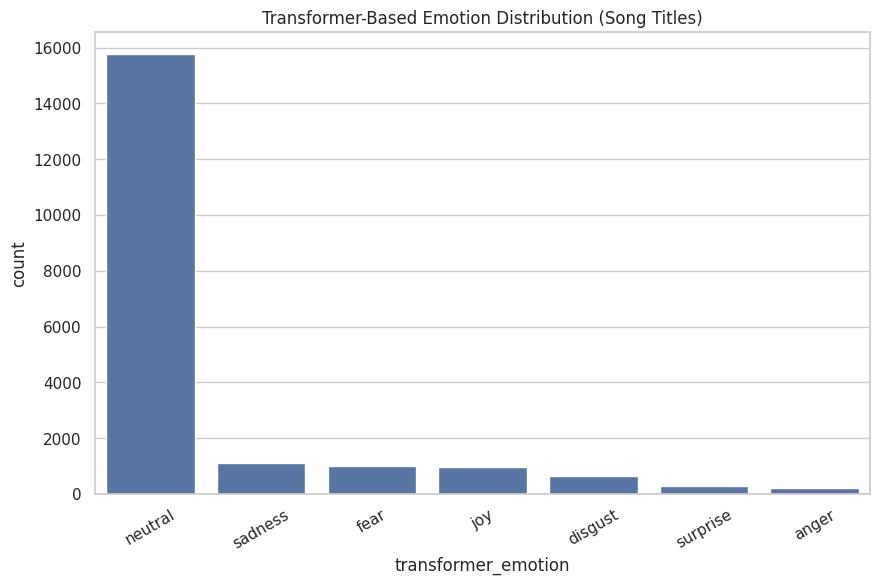

In [ ]:
sns.countplot(
    data=df.loc[sample_idx],
    x='transformer_emotion',
    order=df.loc[sample_idx]['transformer_emotion'].value_counts().index
)
plt.title("Transformer-Based Emotion Distribution (Song Titles)")
plt.xticks(rotation=30)
plt.show()


In [ ]:
emotion_ratio = (
    df.loc[sample_idx]
      .groupby(['popularity_bucket', 'transformer_emotion'])
      .size()
      .reset_index(name='count')
)

emotion_ratio['ratio'] = (
    emotion_ratio
      .groupby('popularity_bucket')['count']
      .transform(lambda x: x / x.sum())
)

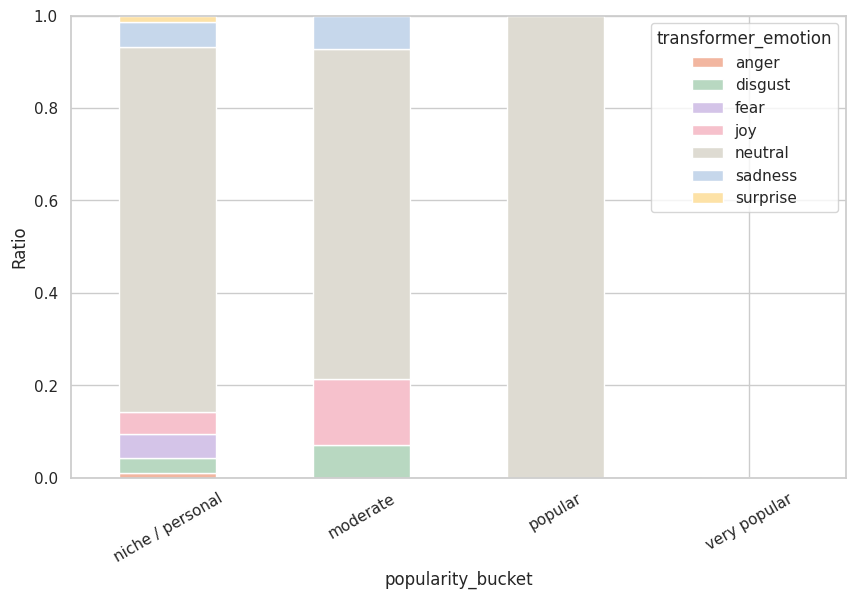

In [ ]:
emotion_palette2 = {
    "joy": "#f6c1cc",        # soft pink
    "sadness": "#c6d7eb",    # pastel blue
    "anger": "#f2b6a0",      # muted coral
    "fear": "#d4c4e8",       # soft lavender
    "surprise": "#fde2a7",   # pastel yellow
    "disgust": "#b8d8c1",    # muted sage green
    "neutral": "#dedbd2"      # warm light neutral (distinct from bg)
}


emotion_ratio_pivot = (
    emotion_ratio
    .pivot(
        index='popularity_bucket',
        columns='transformer_emotion',
        values='ratio'
    )
    .fillna(0)
    .reindex(bucket_order)
)

emotion_ratio_pivot.plot(
    kind='bar',
    stacked=True,
    figsize=(10, 6),
    color=[emotion_palette2.get(c, "#dddddd") for c in emotion_ratio_pivot.columns]
)

plt.ylabel("Ratio")
plt.xticks(rotation=30)
plt.ylim(0, 1)
plt.show()


**Comparing: raw title for transformer cleaned title for TF-IDF**

In [ ]:
sample = df.sample(3000, random_state=42)

sample['emotion_raw'] = sample['name'].apply(
    lambda x: emotion_model(x)[0]['label']
)

sample['emotion_clean'] = sample['clean_name'].apply(
    lambda x: emotion_model(x)[0]['label']
)

pd.crosstab(sample['emotion_raw'], sample['emotion_clean'], normalize='index')

In [ ]:
ct = pd.crosstab(
    sample['emotion_raw'],
    sample['emotion_clean'],
    normalize='index'
)

ct

In [ ]:
plt.figure(figsize=(8,6))
sns.heatmap(
    ct,
    annot=True,
    fmt=".2f",
    cmap="Blues"
)

plt.title("Emotion Shift: Raw vs Cleaned Song Titles")
plt.xlabel("Emotion (Cleaned Title)")
plt.ylabel("Emotion (Raw Title)")
plt.show()

In [ ]:
#quantify disagreement

agreement_rate = np.mean(
    sample['emotion_raw'] == sample['emotion_clean']
)

agreement_rate
print(f"Agreement rate: {agreement_rate:.2%}")


In [ ]:
#emotion wise stability

stability = np.diag(ct)
stability_df = pd.DataFrame({
    'emotion': ct.index,
    'stability': stability
}).sort_values('stability')

stability_df

In [ ]:
sns.barplot(
    data=stability_df,
    x='stability',
    y='emotion'
)
plt.title("Emotion Stability After Title Cleaning")
plt.xlabel("Probability of Same Emotion")
plt.show()

In [ ]:
changed = sample[
    sample['emotion_raw'] != sample['emotion_clean']
]

changed[['name', 'clean_name',
         'emotion_raw', 'emotion_clean']].head(10)


**ECDF: popularity actually doesn’t scale with size**

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sample = df.sample(20000, random_state=42)

plt.figure(figsize=(10,6))
sns.ecdfplot(
    data=sample,
    x="num_followers",
    hue="popularity_bucket"
)
plt.xscale("log")
plt.xlabel("Number of followers (log scale)")
plt.ylabel("Cumulative proportion of playlists")
plt.title(
    "Follower distributions differ sharply by popularity bucket\n"
    "ECDF reveals structural separation, not just outliers"
)
plt.show()


**Density-aware size vs popularity**

In [ ]:
sample = df.sample(30000, random_state=42)

plt.figure(figsize=(10,6))
plt.hexbin(
    np.log1p(sample["num_tracks"]),
    np.log1p(sample["num_followers"]),
    gridsize=40,
    mincnt=1
)
plt.colorbar(label="Playlist density")
plt.xlabel("log(1 + number of tracks)")
plt.ylabel("log(1 + number of followers)")
plt.title(
    "Playlist size has weak influence on popularity\n"
    "Density reveals saturation, not growth"
)
plt.show()


**Collaborative effect — show distribution shift, not medians**

In [ ]:
plt.figure(figsize=(10,6))
sns.kdeplot(
    data=df.sample(20000, random_state=42),
    x=np.log1p(df["num_followers"]),
    hue="collaborative",
    fill=True,
    common_norm=False,
    alpha=0.4
)
plt.xlabel("log(1 + number of followers)")
plt.title(
    "Collaborative playlists skew slightly more popular\n"
    "But still follow long-tail dynamics"
)
plt.show()


**bold texEmotion plots: remove visual noise**

In [ ]:
emotion_filtered = df[df["emotion"] != "unknown"]

emotion_popularity = (
    emotion_filtered
    .groupby(["popularity_bucket", "emotion"])
    .size()
    .reset_index(name="count")
)

emotion_popularity["ratio"] = (
    emotion_popularity
    .groupby("popularity_bucket")["count"]
    .transform(lambda x: x / x.sum())
)

import plotly.express as px

fig = px.bar(
    emotion_popularity,
    x="popularity_bucket",
    y="ratio",
    color="emotion",
    barmode="stack",
    title="Emotion composition of playlists with detectable affect",
    labels={"ratio": "Proportion of playlists"}
)

fig.update_yaxes(tickformat=".0%")
fig.show()


**Cluster map: add semantic anchors**

In [ ]:
cluster_labels = {
    0: "Workout / Power",
    1: "Nostalgia / Country",
    2: "Rap / Trap",
    3: "Seasonal / Calm",
    4: "Summer / Indie",
    5: "Discovery / New",
    6: "Roadtrip / Acoustic",
    7: "Chill / R&B"
}

sample_df["cluster_label"] = sample_df["theme_cluster"].map(cluster_labels)

fig = px.scatter(
    sample_df,
    x="x",
    y="y",
    color="cluster_label",
    title="Semantic map of playlist names\nTF-IDF compressed into 2D",
    opacity=0.6
)
fig.show()
